In [1]:
!pip -q install gensim numpy pandas scikit-learn scipy matplotlib


In [2]:
from google.colab import files
files.upload()


Saving AG_News_Subset.csv to AG_News_Subset (2).csv
Saving best_w2v.kv to best_w2v (1).kv


{'AG_News_Subset (2).csv': b'Class Index,Title,Description\r\r\n3,Fears for T N pension after talks,Unions representing workers at Turner   Newall say they are \'disappointed\' after talks with stricken parent firm Federal Mogul.\r\r\n4,The Race is On: Second Private Team Sets Launch Date for Human Spaceflight (SPACE.com),"SPACE.com - TORONTO, Canada -- A second\\team of rocketeers competing for the  #36;10 million Ansari X Prize, a contest for\\privately funded suborbital space flight, has officially announced the first\\launch date for its manned rocket."\r\r\n4,Ky. Company Wins Grant to Study Peptides (AP),"AP - A company founded by a chemistry researcher at the University of Louisville won a grant to develop a method of producing better peptides, which are short chains of amino acids, the building blocks of proteins."\r\r\n4,Prediction Unit Helps Forecast Wildfires (AP),"AP - It\'s barely dawn when Mike Fitzpatrick starts his shift with a blur of colorful maps, figures and endless 

In [3]:
import os, re, itertools, string
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_recall_fscore_support, confusion_matrix

import gensim.downloader as api
from gensim.models import Word2Vec, KeyedVectors

LABEL_ORDER = ["World", "Sports", "Business", "Sci/Tech"]
LABEL_MAP = {1:"World", 2:"Sports", 3:"Business", 4:"Sci/Tech"}

token_pattern = re.compile(r"\b\w+\b")
def tokenize(text):
    text = str(text).lower()
    toks = token_pattern.findall(text)
    toks = ["<NUM>" if t.isdigit() else t for t in toks]
    return toks

def document_vector_average(texts, kv):
    dim = kv.vector_size
    X = np.zeros((len(texts), dim), dtype=np.float32)
    oov_rates = []

    for i, doc in enumerate(texts):
        toks = tokenize(doc)
        if len(toks) == 0:
            X[i] = np.zeros(dim)
            oov_rates.append(1.0)
            continue

        inv = [t for t in toks if t in kv]
        oov_rates.append(1.0 - (len(inv) / len(toks)))

        if len(inv) == 0:
            X[i] = np.zeros(dim)
        else:
            X[i] = np.mean([kv[t] for t in inv], axis=0)

    return X, float(np.mean(oov_rates))

def eval_macro(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    p, r, f1, _ = precision_recall_fscore_support(
        y_true, y_pred, average="macro", zero_division=0
    )
    return acc, p, r, f1

def plot_cm(cm, labels, title):
    plt.figure(figsize=(5, 4))
    plt.imshow(cm, interpolation="nearest", cmap=plt.cm.Blues)
    plt.title(title)
    plt.colorbar()
    ticks = np.arange(len(labels))
    plt.xticks(ticks, labels, rotation=45)
    plt.yticks(ticks, labels)

    thresh = cm.max() / 2.0
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(
            j, i, str(cm[i, j]),
            ha="center",
            color="white" if cm[i, j] > thresh else "black"
        )
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.tight_layout()
    plt.show()


In [4]:
df = pd.read_csv("AG_News_Subset.csv")
print("Shape:", df.shape)
print("Columns:", df.columns.tolist())
display(df.head())

cols = [c.lower().replace(" ", "") for c in df.columns]
def col(name):
    name = name.lower().replace(" ", "")
    return df.columns[cols.index(name)]

if ("title" in cols) and ("description" in cols) and ("classindex" in cols):
    df["text"] = df[col("title")].astype(str) + " " + df[col("description")].astype(str)
    y_raw = df[col("classindex")]
elif ("text" in cols) and ("label" in cols):
    df["text"] = df[col("text")].astype(str)
    y_raw = df[col("label")]
else:
    raise ValueError(f"Unexpected columns: {df.columns.tolist()}")

if pd.api.types.is_numeric_dtype(y_raw):
    y = y_raw.astype(int).map(LABEL_MAP)
else:
    y = y_raw.astype(str)

print("\nLabel distribution:")
print(y.value_counts())


Shape: (7600, 3)
Columns: ['Class Index', 'Title', 'Description']


,Class Index,Title,Description
0,3,Fears for T N pension after talks,Unions representing workers at Turner Newall...
1,4,The Race is On: Second Private Team Sets Launc...,"SPACE.com - TORONTO, Canada -- A second\team o..."
2,4,Ky. Company Wins Grant to Study Peptides (AP),AP - A company founded by a chemistry research...
3,4,Prediction Unit Helps Forecast Wildfires (AP),AP - It's barely dawn when Mike Fitzpatrick st...
4,4,Calif. Aims to Limit Farm-Related Smog (AP),AP - Southern California's smog-fighting agenc...



Label distribution:
Class Index
Business    1900
Sci/Tech    1900
Sports      1900
World       1900
Name: count, dtype: int64


In [5]:
X = df["text"].astype(str).tolist()

X_train, X_test, y_train, y_test = train_test_split(
    X, y.tolist(),
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("Train:", len(X_train), "Test:", len(X_test))


Train: 6080 Test: 1520


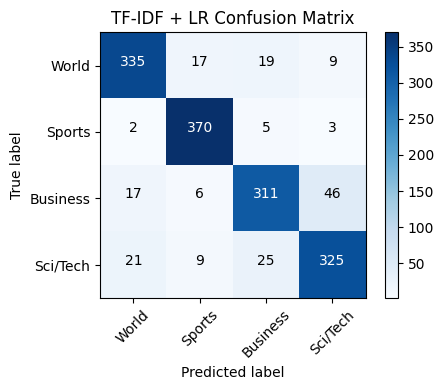

In [6]:
results = []

tfidf = TfidfVectorizer(max_features=50000, ngram_range=(1,2), stop_words="english")
Xtr = tfidf.fit_transform(X_train)
Xte = tfidf.transform(X_test)

clf = LogisticRegression(max_iter=2000, n_jobs=-1)
clf.fit(Xtr, y_train)
pred = clf.predict(Xte)

acc, p, r, f1 = eval_macro(y_test, pred)
results.append({
    "Method": "TF-IDF + LR",
    "Accuracy": acc,
    "Macro-Precision": p,
    "Macro-Recall": r,
    "Macro-F1": f1,
    "Avg-OOV-Test": np.nan
})

cm = confusion_matrix(y_test, pred, labels=LABEL_ORDER)
plot_cm(cm, LABEL_ORDER, "TF-IDF + LR Confusion Matrix")


In [7]:
def build_best_w2v_single_file():
    PUNCT_TABLE = str.maketrans("", "", string.punctuation)

    def preprocess_token(tok):
        tok = tok.lower()
        if tok.isdigit():
            return "<NUM>"
        tok = tok.translate(PUNCT_TABLE)
        return tok if tok else None

    print("[W2V] Loading text8 ...")
    dataset = api.load("text8")
    sentences_raw = list(dataset)
    print("[W2V] text8 sentences:", len(sentences_raw))

    sentences = []
    for sent in sentences_raw:
        new = []
        for t in sent:
            t2 = preprocess_token(t)
            if t2:
                new.append(t2)
        if new:
            sentences.append(new)

    print("[W2V] Training best (skipgram, dim=300, win=5, neg=5, epochs=5) ...")
    model = Word2Vec(
        sentences=sentences,
        vector_size=300,
        window=5,
        sg=1,
        negative=5,
        min_count=5,
        workers=8,
        epochs=5
    )

    model.wv.save_word2vec_format("best_w2v.vec", binary=True)
    print("[W2V] Saved single-file: best_w2v.vec")
    return KeyedVectors.load_word2vec_format("best_w2v.vec", binary=True)

w2v_kv = None
if os.path.exists("best_w2v.kv"):
    try:
        w2v_kv = KeyedVectors.load("best_w2v.kv", mmap="r")
        print("[W2V] Loaded best_w2v.kv ✅ dim =", w2v_kv.vector_size)
    except Exception as e:
        print("[W2V] best_w2v.kv failed:", type(e).__name__, e)

if w2v_kv is None:
    print("[W2V] Falling back to rebuilding best model ...")
    w2v_kv = build_best_w2v_single_file()


[W2V] best_w2v.kv failed: FileNotFoundError [Errno 2] No such file or directory: 'best_w2v.kv.vectors.npy'
[W2V] Falling back to rebuilding best model ...
[W2V] Loading text8 ...
[==================================================] 100.0% 31.6/31.6MB downloaded
[W2V] text8 sentences: 1701
[W2V] Training best (skipgram, dim=300, win=5, neg=5, epochs=5) ...
[W2V] Saved single-file: best_w2v.vec


Avg OOV (test) Word2Vec: 0.0611


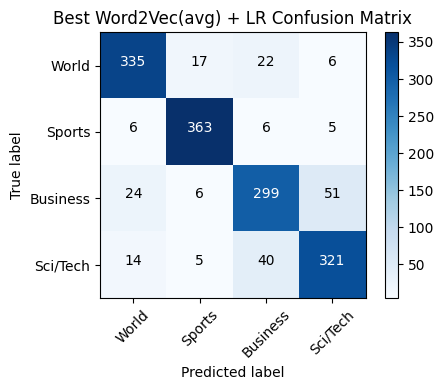

In [8]:
Xtr_w2v, oov_tr = document_vector_average(X_train, w2v_kv)
Xte_w2v, oov_te = document_vector_average(X_test,  w2v_kv)
print(f"Avg OOV (test) Word2Vec: {oov_te:.4f}")

clf = LogisticRegression(max_iter=2000, n_jobs=-1)
clf.fit(Xtr_w2v, y_train)
pred = clf.predict(Xte_w2v)

acc, p, r, f1 = eval_macro(y_test, pred)
results.append({
    "Method": "Best Word2Vec(avg) + LR",
    "Accuracy": acc,
    "Macro-Precision": p,
    "Macro-Recall": r,
    "Macro-F1": f1,
    "Avg-OOV-Test": oov_te
})

cm = confusion_matrix(y_test, pred, labels=LABEL_ORDER)
plot_cm(cm, LABEL_ORDER, "Best Word2Vec(avg) + LR Confusion Matrix")


[==================================================] 100.0% 128.1/128.1MB downloaded
Loaded GloVe dim = 100
Avg OOV (test) GloVe: 0.0360


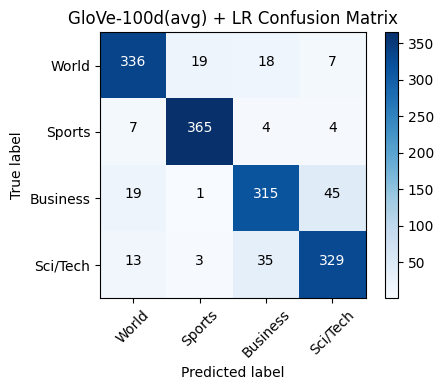

In [9]:
glove_kv = api.load("glove-wiki-gigaword-100")
print("Loaded GloVe dim =", glove_kv.vector_size)

Xtr_g, oov_tr_g = document_vector_average(X_train, glove_kv)
Xte_g, oov_te_g = document_vector_average(X_test,  glove_kv)
print(f"Avg OOV (test) GloVe: {oov_te_g:.4f}")

clf = LogisticRegression(max_iter=2000, n_jobs=-1)
clf.fit(Xtr_g, y_train)
pred = clf.predict(Xte_g)

acc, p, r, f1 = eval_macro(y_test, pred)
results.append({
    "Method": "GloVe-100d(avg) + LR",
    "Accuracy": acc,
    "Macro-Precision": p,
    "Macro-Recall": r,
    "Macro-F1": f1,
    "Avg-OOV-Test": oov_te_g
})

cm = confusion_matrix(y_test, pred, labels=LABEL_ORDER)
plot_cm(cm, LABEL_ORDER, "GloVe-100d(avg) + LR Confusion Matrix")


In [10]:
results_df = pd.DataFrame(results)
display(results_df)

results_df.to_csv("downstream_results.csv", index=False)
print("Saved: downstream_results.csv")

from google.colab import files
files.download("downstream_results.csv")


,Method,Accuracy,Macro-Precision,Macro-Recall,Macro-F1,Avg-OOV-Test
0,TF-IDF + LR,0.882237,0.881546,0.882237,0.881537,NaN
1,Best Word2Vec(avg) + LR,0.867105,0.866282,0.867105,0.866581,0.061080
2,GloVe-100d(avg) + LR,0.884868,0.884510,0.884868,0.884621,0.035978


Saved: downstream_results.csv


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>